In [40]:
# makes plots appear in ipython
%matplotlib inline

In [42]:
__author__ = 'brendan', 'michael'

import helper_functions
import viz_functions as viz
import networkx as nx
#import matplotlib.pyplot as plt
import os
import datetime
from operator import itemgetter
import numpy as np
import calendar
from __future__ import division
import time

proj_cwd = os.path.dirname(os.getcwd())
data_dir = os.path.join(proj_cwd, 'data')
doc_dir = os.path.join(proj_cwd, 'docs') ## for saving the plots later
doc_scotus_dir = os.path.join(doc_dir, 'scotus') ## for saving the plots under 'scotus' folder in 'docs'
###############
# BUILD A GRAPH
###############
# Load data from the CSVs
edgelist_data = helper_functions.csv_to_list(os.path.join(data_dir, 'scotus'),
                                             'citations_sublist.csv',
                                             1, 0)
node_data = helper_functions.csv_to_list(os.path.join(data_dir, 'scotus'),
                                         'consolidation.csv',
                                         1, 0)

# Instantiate a directed graph object, D
D = nx.DiGraph()

# Add our nodes to D
for row in node_data:
    # It is really easy to add arbitrary info about each node or edge. For example, here, I load each node with a
    # date, judges and citation_id attribute.
    case_number = int(row[0])
    month, day, year = ['', '', ''] if row[3] is '' else [int(element) for element in row[3].rsplit('/')]
    file_date = '' if month is '' else datetime.date(year=year, month=month, day=day)
    judges = row[4]
    citation_id = '' if row[5] is '' else int(row[5])
    D.add_node(case_number,
               date=file_date,
               judges=judges,
               citation_id=citation_id,
               year=year)

for row in edgelist_data:
    citer = row[0]
    cited = row[1]
    # Edges point from citer to cited -- so the node with the highest in degree represents the most cited decision
    D.add_edge(int(row[0]), int(row[1]), random_attribute = 'random_string')

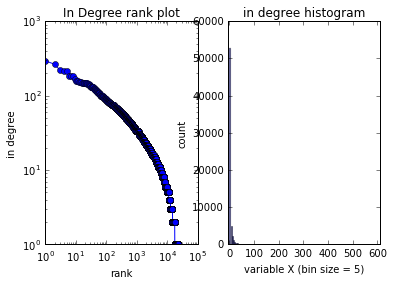

In [43]:
viz.rank_plot_and_histogram(D, 'in_degree', os.path.join(doc_scotus_dir, "indeg_rank_hist.png"))

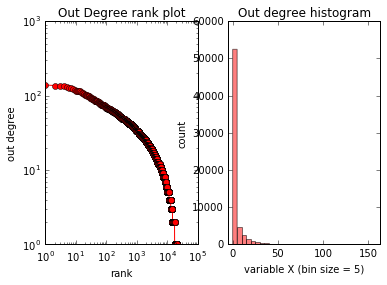

In [44]:
viz.rank_plot_and_histogram(D, 'out_degree', os.path.join(doc_scotus_dir, "outdeg_rank_hist.png"))

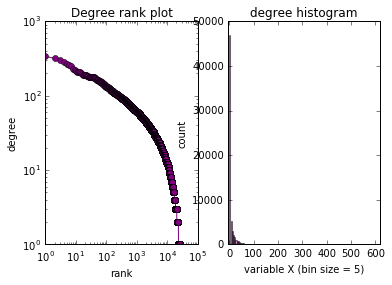

In [45]:
viz.rank_plot_and_histogram(D, 'degree', os.path.join(doc_scotus_dir, "deg_rank_hist.png"))

In [46]:
viz.years_useable(D)

years you should use: from  1754  to  2016


--- 23.1970000267 seconds ---


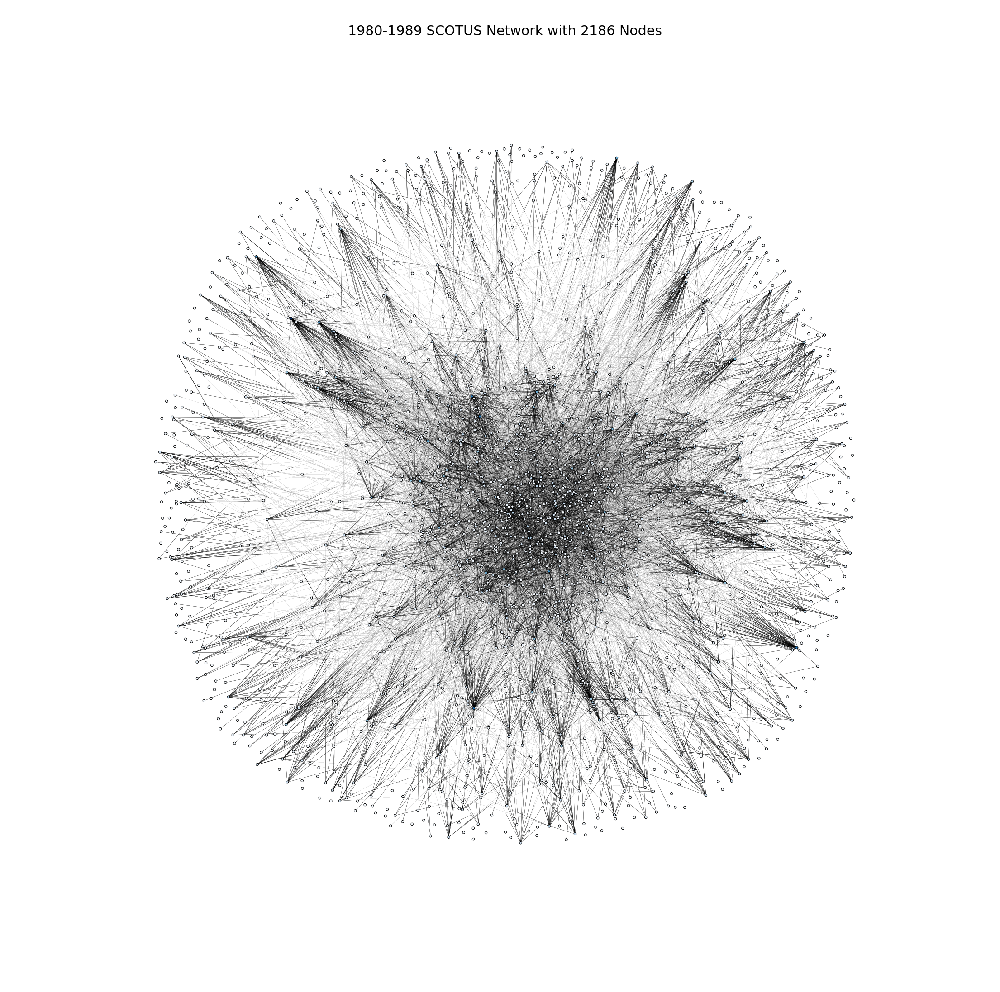

In [47]:
viz.spring_layout(D, 1980, 1989, os.path.join(doc_scotus_dir, 'spring_layout_scotus_1980s.png'))

--- 3.38499999046 seconds ---


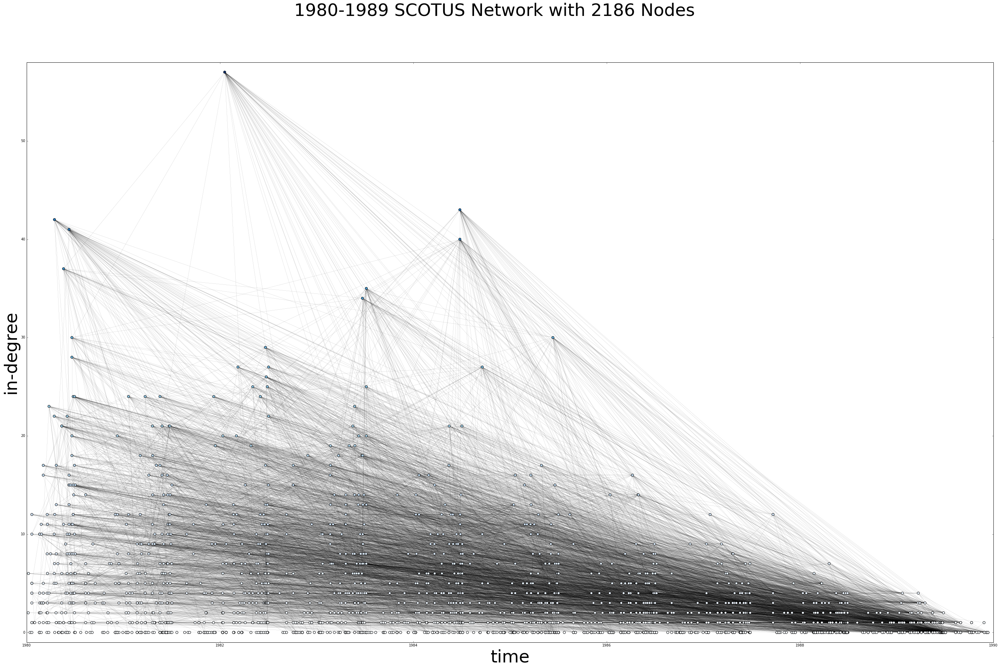

In [48]:
viz.chronological_indeg_layout(D, 1980, 1989, os.path.join(doc_scotus_dir, 'chron_layout_scotus_1980s.png'))

--- 507.739000082 seconds ---


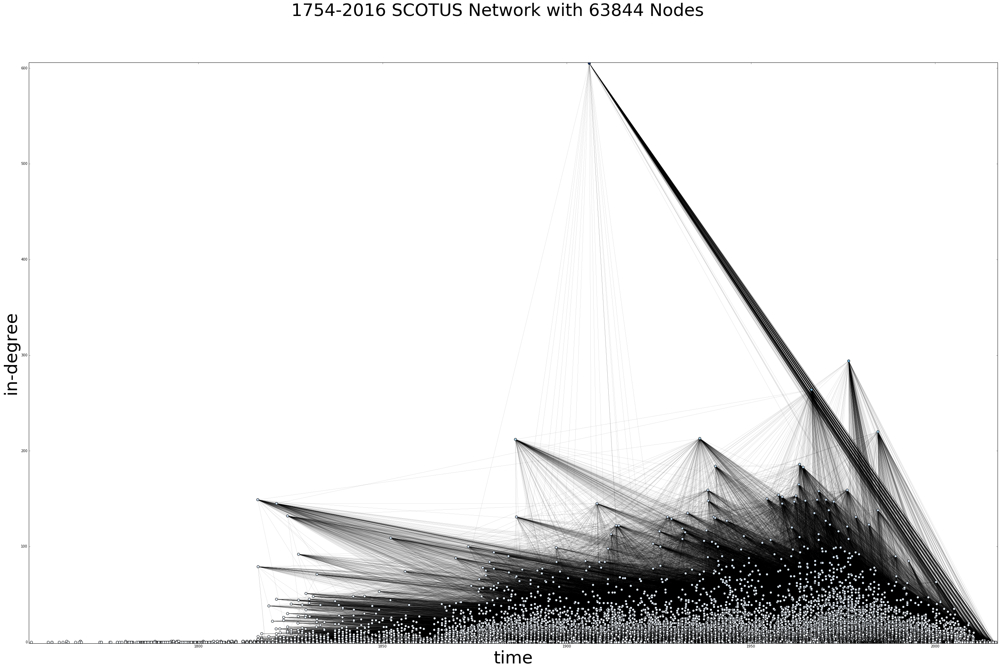

In [49]:
viz.chronological_indeg_layout(D, 1754, 2016, os.path.join(doc_scotus_dir, 'chron_layout_scotus_entire.png'))

In [50]:
viz.years_useable_after_del(D)

after deleting nodes, years you should use: from  1764  to  2016


--- 110.176000118 seconds ---


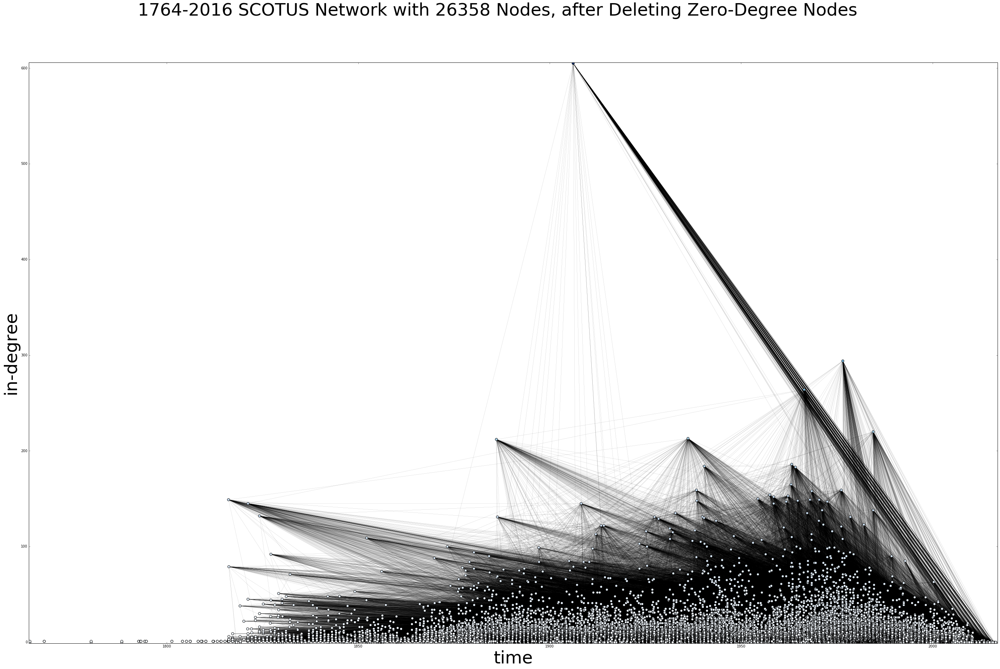

In [51]:
viz.chronological_indeg_layout_after_del(D, 1764, 2016, os.path.join(doc_scotus_dir, 'chron_layout_scotus_entire_afterdel.png'))

--- 5.32800006866 seconds ---


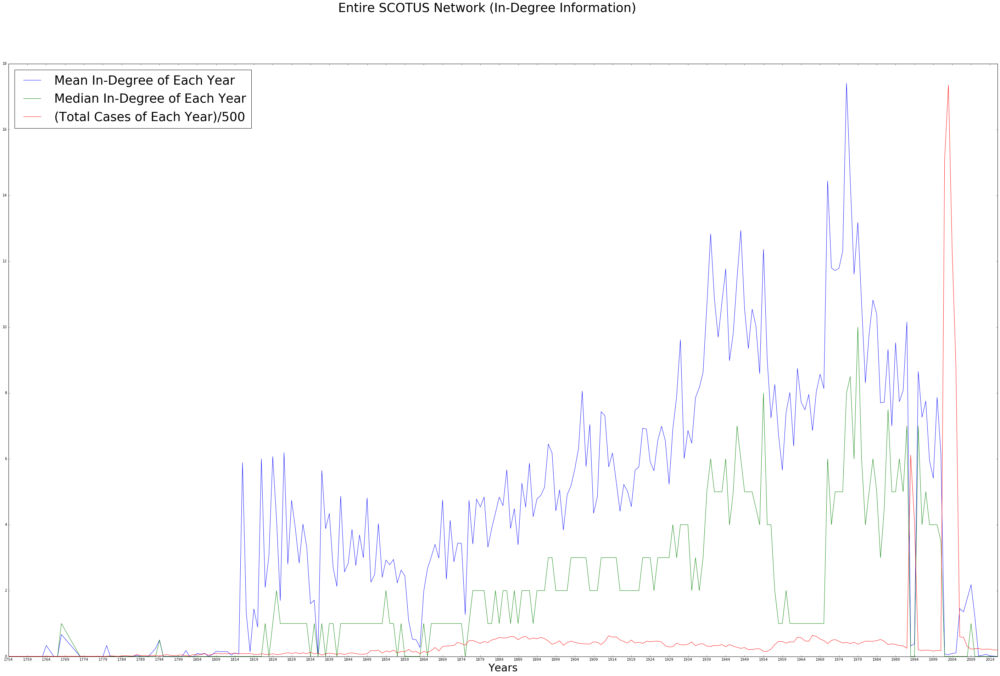

In [52]:
#viz.indeg_time_series_plot(D, True, False, False, os.path.join(doc_scotus_dir, 'indeg_mean_plot.png'))
#viz.indeg_time_series_plot(D, True, True, False, os.path.join(doc_scotus_dir, 'indeg_mean_median_plot.png'))
#viz.indeg_time_series_plot(D, True, False, True, os.path.join(doc_scotus_dir, 'indeg_mean_total_plot.png'))
#viz.indeg_time_series_plot(D, False, True, False, os.path.join(doc_scotus_dir, 'indeg_median_plot.png'))
#viz.indeg_time_series_plot(D, False, True, True, os.path.join(doc_scotus_dir, 'indeg_median_total_plot.png'))
#viz.indeg_time_series_plot(D, False, False, True, os.path.join(doc_scotus_dir, 'total_plot.png'))
viz.indeg_time_series_plot(D, True, True, True, os.path.join(doc_scotus_dir, 'indeg_mean_median_total_plot.png'))
#viz.indeg_time_series_plot(D, False, False, False, os.path.join(doc_scotus_dir, 'indeg_mean_median_total_plot.png'))

--- 4.55599999428 seconds ---


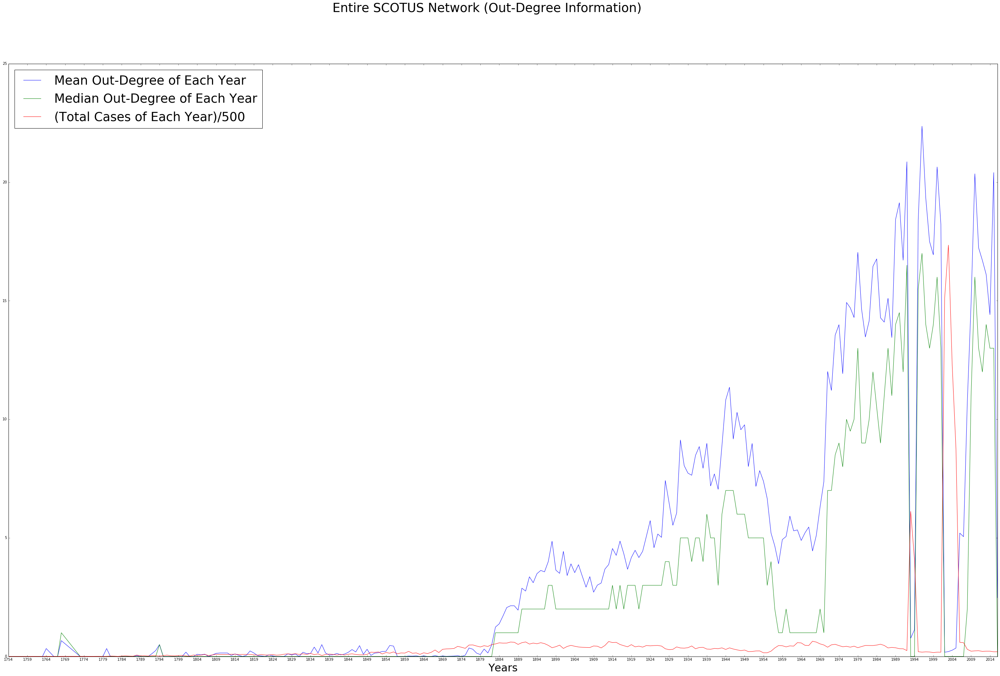

In [53]:
#viz.outdeg_time_series_plot(D, True, False, False, os.path.join(doc_scotus_dir, 'outdeg_mean_plot.png'))
#viz.outdeg_time_series_plot(D, True, True, False, os.path.join(doc_scotus_dir, 'outdeg_mean_median_plot.png'))
#viz.outdeg_time_series_plot(D, True, False, True, os.path.join(doc_scotus_dir, 'outdeg_mean_total_plot.png'))
#viz.outdeg_time_series_plot(D, False, True, False, os.path.join(doc_scotus_dir, 'outdeg_median_plot.png'))
#viz.outdeg_time_series_plot(D, False, True, True, os.path.join(doc_scotus_dir, 'outdeg_median_total_plot.png'))
#viz.outdeg_time_series_plot(D, False, False, True, os.path.join(doc_scotus_dir, 'total_plot.png'))
viz.outdeg_time_series_plot(D, True, True, True, os.path.join(doc_scotus_dir, 'outdeg_mean_median_total_plot.png'))
#viz.outdeg_time_series_plot(D, False, False, False, os.path.join(doc_scotus_dir, 'outdeg_mean_median_total_plot.png'))

--- 4.4279999733 seconds ---


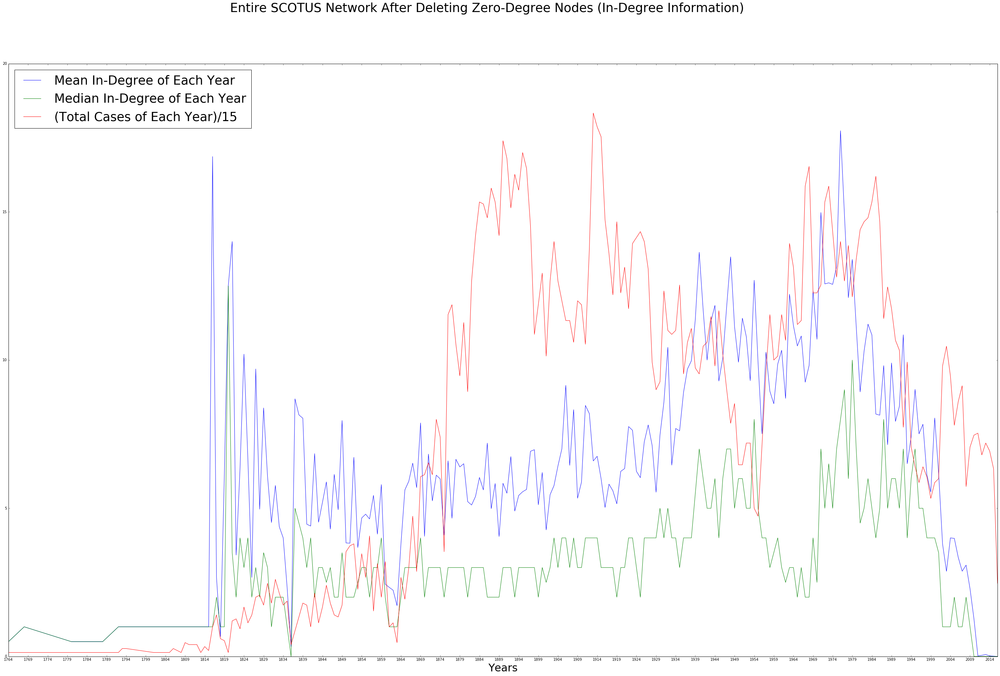

In [54]:
#viz.indeg_time_series_plot_after_del(D, True, False, False, os.path.join(doc_scotus_dir, 'indeg_mean_plot_afterdel.png'))
#viz.indeg_time_series_plot_after_del(D, True, True, False, os.path.join(doc_scotus_dir, 'indeg_mean_median_plot_afterdel.png'))
#viz.indeg_time_series_plot_after_del(D, True, False, True, os.path.join(doc_scotus_dir, 'indeg_mean_total_plot_afterdel.png'))
#viz.indeg_time_series_plot_after_del(D, False, True, False, os.path.join(doc_scotus_dir, 'indeg_median_plot_afterdel.png'))
#viz.indeg_time_series_plot_after_del(D, False, True, True, os.path.join(doc_scotus_dir, 'indeg_median_total_plot_afterdel.png'))
#viz.indeg_time_series_plot_after_del(D, False, False, True, os.path.join(doc_scotus_dir, 'total_plot_afterdel.png'))
viz.indeg_time_series_plot_after_del(D, True, True, True, os.path.join(doc_scotus_dir, 'indeg_mean_median_total_plot_afterdel.png'))
#viz.indeg_time_series_plot_after_del(D, False, False, False, os.path.join(doc_scotus_dir, 'indeg_mean_median_total_plot_afterdel.png'))

--- 4.7990000248 seconds ---


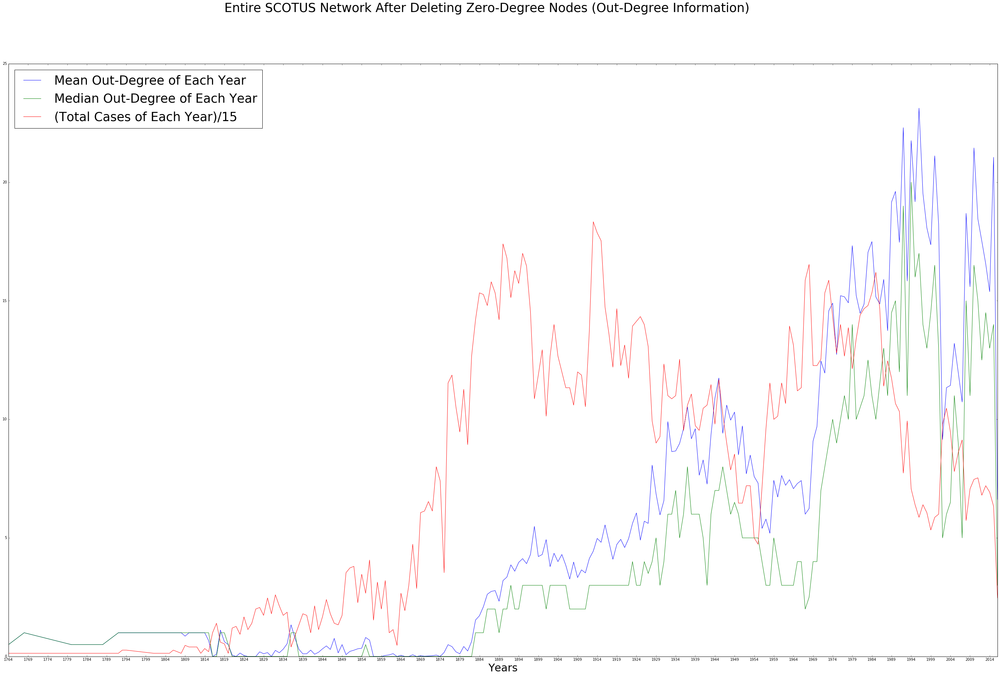

In [55]:
#viz.outdeg_time_series_plot_after_del(D, True, False, False, os.path.join(doc_scotus_dir, 'outdeg_mean_plot_afterdel.png'))
#viz.outdeg_time_series_plot_after_del(D, True, True, False, os.path.join(doc_scotus_dir, 'outdeg_mean_median_plot_afterdel.png'))
#viz.outdeg_time_series_plot_after_del(D, True, False, True, os.path.join(doc_scotus_dir, 'outdeg_mean_total_plot_afterdel.png'))
#viz.outdeg_time_series_plot_after_del(D, False, True, False, os.path.join(doc_scotus_dir, 'outdeg_median_plot_afterdel.png'))
#viz.outdeg_time_series_plot_after_del(D, False, True, True, os.path.join(doc_scotus_dir, 'outdeg_median_total_plot_afterdel.png'))
#viz.outdeg_time_series_plot_after_del(D, False, False, True, os.path.join(doc_scotus_dir, 'total_plot_afterdel.png'))
viz.outdeg_time_series_plot_after_del(D, True, True, True, os.path.join(doc_scotus_dir, 'outdeg_mean_median_total_plot_afterdel.png'))
#viz.outdeg_time_series_plot_after_del(D, False, False, False, os.path.join(doc_scotus_dir, 'outdeg_mean_median_total_plot_afterdel.png'))

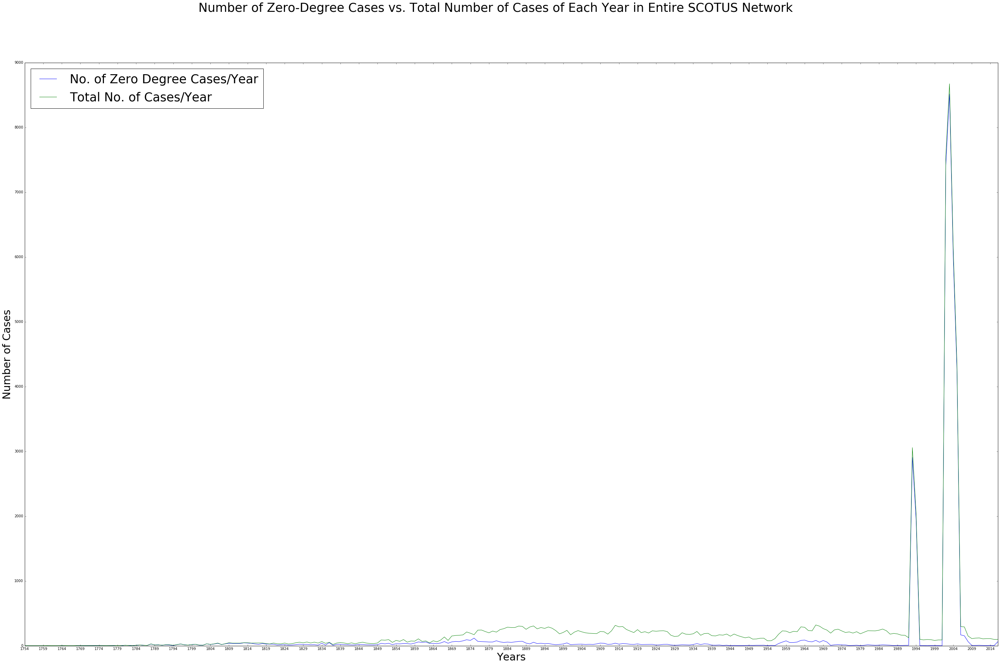

--- 5.91200017929 seconds ---


In [56]:
viz.total_vs_zero_cases(D, os.path.join(doc_scotus_dir, 'total_vs_zero_deg_cases.png'))